# BrushCue Example: Film Grain

<a href="https://colab.research.google.com/github/ditotechnologies/monorepo/blob/main/py/brushcue/examples/film_grain.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

You can use this tool online at https://www.brushcue.com/tools/film-grain

In [ ]:
!pip install brushcue

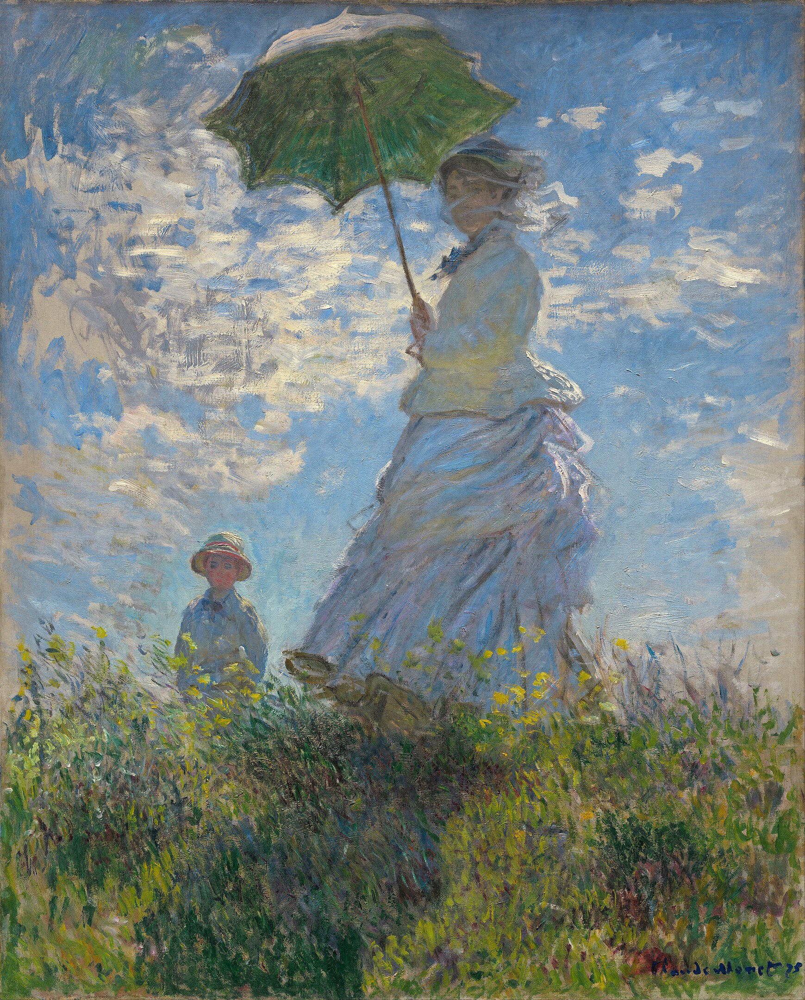

In [1]:
import brushcue
from PIL import Image
import io

input_image_1 = brushcue.composition_monet_women_with_parasol() # insert your own image here
string_constant_2 = brushcue.string_constant("let texture_dimens = textureDimensions(input_texture);\nlet width = f32(texture_dimens.x);\nlet height = f32(texture_dimens.y);\nlet avg_dimen = (width + height) * 0.5;\nlet uv = vec2<f32>(f32(position.x) / width, f32(position.y) / height);\nlet L = input.x;\nlet a = input.y;\nlet b = input.z;\nlet alpha = input.a;\n\nlet grain_strength = (1.0 - L) * grain_strength_param * 0.1;\n\nlet fine_freq = fine_grain_frequency * avg_dimen / 1024.0;\nlet medium_freq = medium_grain_frequency * avg_dimen / 1024.0;\nlet high_freq = high_grain_frequency * avg_dimen / 1024.0;\n\n// Fine grain noise\nlet p = uv * fine_freq;\nlet pi = floor(p);\nlet pf = fract(p);\nlet u = pf * pf * (3.0 - 2.0 * pf);\n\nlet h1 = fract(sin(dot(pi, vec2<f32>(12.9898, 78.233))) * 43758.5453);\nlet h2 = fract(sin(dot(pi + vec2<f32>(1.0, 0.0), vec2<f32>(12.9898, 78.233))) * 43758.5453);\nlet h3 = fract(sin(dot(pi + vec2<f32>(0.0, 1.0), vec2<f32>(12.9898, 78.233))) * 43758.5453);\nlet h4 = fract(sin(dot(pi + vec2<f32>(1.0, 1.0), vec2<f32>(12.9898, 78.233))) * 43758.5453);\n\nlet v0 = mix(h1, h2, u.x);\nlet v1 = mix(h3, h4, u.x);\nlet fine_noise = mix(v0, v1, u.y);\n\n// Medium grain noise\nlet medium_p = uv * medium_freq;\nlet medium_pi = floor(medium_p);\nlet medium_pf = fract(medium_p);\nlet medium_u = medium_pf * medium_pf * (3.0 - 2.0 * medium_pf);\n\nlet mh1 = fract(sin(dot(medium_pi, vec2<f32>(12.9898, 78.233))) * 43758.5453);\nlet mh2 = fract(sin(dot(medium_pi + vec2<f32>(1.0, 0.0), vec2<f32>(12.9898, 78.233))) * 43758.5453);\nlet mh3 = fract(sin(dot(medium_pi + vec2<f32>(0.0, 1.0), vec2<f32>(12.9898, 78.233))) * 43758.5453);\nlet mh4 = fract(sin(dot(medium_pi + vec2<f32>(1.0, 1.0), vec2<f32>(12.9898, 78.233))) * 43758.5453);\n\nlet mv0 = mix(mh1, mh2, medium_u.x);\nlet mv1 = mix(mh3, mh4, medium_u.x);\nlet medium_noise = mix(mv0, mv1, medium_u.y);\n\n// High grain noise\nlet high_p = uv * high_freq;\nlet high_pi = floor(high_p);\nlet high_pf = fract(high_p);\nlet high_u = high_pf * high_pf * (3.0 - 2.0 * high_pf);\n\nlet hh1 = fract(sin(dot(high_pi, vec2<f32>(12.9898, 78.233))) * 43758.5453);\nlet hh2 = fract(sin(dot(high_pi + vec2<f32>(1.0, 0.0), vec2<f32>(12.9898, 78.233))) * 43758.5453);\nlet hh3 = fract(sin(dot(high_pi + vec2<f32>(0.0, 1.0), vec2<f32>(12.9898, 78.233))) * 43758.5453);\nlet hh4 = fract(sin(dot(high_pi + vec2<f32>(1.0, 1.0), vec2<f32>(12.9898, 78.233))) * 43758.5453);\n\nlet hv0 = mix(hh1, hh2, high_u.x);\nlet hv1 = mix(hh3, hh4, high_u.x);\nlet high_noise = mix(hv0, hv1, high_u.y);\n\n// Combine noises with separate weights, normalize to -0.5 to 0.5\nlet combined_noise = (fine_noise * fine_weight + medium_noise * medium_weight + high_noise * high_weight) - 0.5;\nlet grain_amount = combined_noise * grain_strength;\n\n// Apply grain primarily to luminance\nlet L_grained = clamp(L + grain_amount, 0.0, 1.0);\n\n// Minimal color grain for subtle variation\nlet a_grained = clamp(a + grain_amount * 0.02, -0.4, 0.4);\nlet b_grained = clamp(b + grain_amount * 0.02, -0.4, 0.4);\n\nreturn vec4<f32>(L_grained, a_grained, b_grained, alpha);")
string_constant_3 = brushcue.string_constant("// No helpers")
color_profile_oklaba_4 = brushcue.color_profile_ok_lab_a()
color_profile_oklaba_5 = brushcue.color_profile_ok_lab_a()
bool_constant_6 = brushcue.bool_constant(True)
string_constant_7 = brushcue.string_constant("grain_strength_param")
string_constant_8 = brushcue.string_constant("high_weight")
float_constant_9 = brushcue.float_constant(1.0)
string_constant_10 = brushcue.string_constant("high_grain_frequency")
float_constant_11 = brushcue.float_constant(0.20000000298023224)
string_constant_12 = brushcue.string_constant("medium_weight")
float_constant_13 = brushcue.float_constant(300.0)
string_constant_14 = brushcue.string_constant("medium_grain_frequency")
float_constant_15 = brushcue.float_constant(0.30000001192092896)
string_constant_16 = brushcue.string_constant("fine_weight")
float_constant_17 = brushcue.float_constant(50.0)
dictionary_create_18 = brushcue.dictionary_create()
string_constant_19 = brushcue.string_constant("fine_grain_frequency")
float_constant_20 = brushcue.float_constant(0.5)
float_constant_21 = brushcue.float_constant(150.0)
strength_22 = brushcue.float_passthrough(float_constant_9)
high_weight_23 = brushcue.float_passthrough(float_constant_11)
high_grain_frequency_24 = brushcue.float_passthrough(float_constant_13)
medium_weight_25 = brushcue.float_passthrough(float_constant_15)
medium_grain_frequency_26 = brushcue.float_passthrough(float_constant_17)
fine_weight_27 = brushcue.float_passthrough(float_constant_20)
fine_grain_frequency_28 = brushcue.float_passthrough(float_constant_21)
float_add_to_dictionary_29 = brushcue.float_add_to_dictionary(dictionary_create_18, string_constant_19, fine_grain_frequency_28)
float_add_to_dictionary_30 = brushcue.float_add_to_dictionary(float_add_to_dictionary_29, string_constant_16, fine_weight_27)
float_add_to_dictionary_31 = brushcue.float_add_to_dictionary(float_add_to_dictionary_30, string_constant_14, medium_grain_frequency_26)
float_add_to_dictionary_32 = brushcue.float_add_to_dictionary(float_add_to_dictionary_31, string_constant_12, medium_weight_25)
float_add_to_dictionary_33 = brushcue.float_add_to_dictionary(float_add_to_dictionary_32, string_constant_10, high_grain_frequency_24)
float_add_to_dictionary_34 = brushcue.float_add_to_dictionary(float_add_to_dictionary_33, string_constant_8, high_weight_23)
float_add_to_dictionary_35 = brushcue.float_add_to_dictionary(float_add_to_dictionary_34, string_constant_7, strength_22)
film_grain_shader_36 = brushcue.composition_custom_transformer_shader(input_image_1, string_constant_2, string_constant_3, color_profile_oklaba_4, color_profile_oklaba_5, float_add_to_dictionary_35, bool_constant_6)
final_result_37 = brushcue.composition_passthrough(film_grain_shader_36)

ctx = brushcue.Context()
result = final_result_37.execute(ctx)
composition = result.as_composition()
data_bytes = composition.to_image_bytes(ctx)
img = Image.open(io.BytesIO(data_bytes))
img
